# 3DMark Time Spy Results Clustering (Unsupervised Learning)
## Preface

In this dataset I scraped from 3DMark's Time Spy (DX12), I want to know how many distinct clusters or groupings there are between the ~100,000 results that I will be using for unsupervised learning. Initially, I wanted to remove the GPU details and have those as the labels. In retrospect, that was not going to help at all since there are no other GPU data available other than the clock frequencies which could severely affect this whole project from the start (visualization) but the risk outweighs the probable reward if I redo the project later on with more time. For now, CPU manufacturers can also stand as the hidden labels despite its binary classification (AMD or Intel). With these labels, it would be easier to do observations and noticing clustering.

That said, for a variable summary, kindly check the readme on this project's repo at https://github.com/caesarlindog/computer-clustering-3dmarktimespy for more information as I will not discuss them in-depth in this notebook.

I chose 3DMark's Time Spy for this unsupervised learning project since it is the only DX12 benchmark with publicly-available results and relevant system data.

## Imports

In [1]:
%matplotlib inline

import math
import umap
import gower
import random
import prince
import requests
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go

from io import StringIO
from sklearn import manifold
from ipywidgets import interact
from sklearn.cluster import DBSCAN
from sklearn.decomposition import PCA
from sklearn.mixture import GaussianMixture
from scipy.cluster.hierarchy import dendrogram
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from pyclustering.cluster.kmedoids import kmedoids
from sklearn.cluster import AgglomerativeClustering
from sklearn.model_selection import train_test_split
from scipy.spatial.distance import pdist, squareform
from sklearn.metrics import silhouette_score, adjusted_rand_score

# I. Exploratory Data Analysis

*First peek into the data that I managed to collect over the weekend (11/27/2020 - 11/29/2020)*

In [17]:
# dtype mapping for later use
combined_dtypes = {
    "id" : np.uint32,
    "benchmark_version" : np.float16,
    "cmbnd_score" : np.uint16,
    "cmbnd_fps" : np.float16,
    "cpu_clock_freq" : np.float16,
    "cpu_cores" : np.uint8,
    "cpu_litho" : np.uint8,
    "cpu_score" : np.float16,
    "cpu_tdp" : np.uint8,
    "cpu_fps" : np.float16,
    "gpu_avg_clock_freq" : np.float16,
    "gpu_avg_memclock_freq" : np.float16,
    "gpu_avg_freq" : np.uint8,
    "gpu_clock_freq" : np.float16,
    "gpu_count" : np.uint8,
    "gpu_memclock_freq" : np.float16,
    "gpu_score" : np.uint32,
    "gpu_vram" : np.uint16,
    "gt1" : np.float16,
    "gt2" : np.float16,
    "ram" : np.uint16,
    "ram_clock_freq" : np.float16,
    "score" : np.uint16,
}

In [10]:
#from GDrive
orig_url = "https://doc-0g-as-docs.googleusercontent.com/docs/securesc/1q1te36akodfsgq4mvp2sl97jc3ogiqh/b864sgavvdsgrn64q4cv5fhepbh819gq/1608934425000/08117096429457523965/08117096429457523965/1LiFheC9DM-CmBHtrdKxQINef3kAYNLc0?e=download&authuser=0"
#file_id = orig_url.split('/')[-2]
#dwn_url='https://drive.google.com/uc?export=download&id=' + file_id
url = requests.get(orig_url).text
print(url)
#csv_raw = StringIO(url)
#dfs = pd.read_csv(csv_raw)
#print(dfs.head())


<!DOCTYPE html>
<html lang="en">
  <head>
  <meta charset="utf-8">
  <meta content="width=300, initial-scale=1" name="viewport">
  <meta name="description" content="Google Drive is a free way to keep your files backed up and easy to reach from any phone, tablet, or computer. Start with 15GB of Google storage – free.">
  <meta name="google-site-verification" content="LrdTUW9psUAMbh4Ia074-BPEVmcpBxF6Gwf0MSgQXZs">
  <title>Meet Google Drive – One place for all your files</title>
  <style>
  @font-face {
  font-family: 'Open Sans';
  font-style: normal;
  font-weight: 300;
  src: url(//fonts.gstatic.com/s/opensans/v15/mem5YaGs126MiZpBA-UN_r8OUuhs.ttf) format('truetype');
}
@font-face {
  font-family: 'Open Sans';
  font-style: normal;
  font-weight: 400;
  src: url(//fonts.gstatic.com/s/opensans/v15/mem8YaGs126MiZpBA-UFVZ0e.ttf) format('truetype');
}
  </style>
  <style>
  h1, h2 {
  -webkit-animation-duration: 0.1s;
  -webkit-animation-name: fontfix;
  -webkit-animation-iteration-count: 

In [4]:
#pd.read_csv('https://bit.ly/3dmark_xz', compression='xz')
data = pd.read_csv("data/combined.csv.xz", parse_dates=["date"])

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1246201 entries, 0 to 1246200
Data columns (total 35 columns):
 #   Column                 Non-Null Count    Dtype         
---  ------                 --------------    -----         
 0   id                     1246201 non-null  int64         
 1   benchmark              1246201 non-null  object        
 2   benchmark_version      1246201 non-null  float64       
 3   cmbnd_score            1246201 non-null  int64         
 4   cmbnd_fps              1246201 non-null  int64         
 5   cpu_clock_freq         1246201 non-null  int64         
 6   cpu_cores              1246201 non-null  int64         
 7   cpu_litho              1246201 non-null  int64         
 8   cpu_make               1246201 non-null  object        
 9   cpu_score              1246201 non-null  int64         
 10  cpu_sku                1246201 non-null  object        
 11  cpu_socket             1246093 non-null  object        
 12  cpu_tdp                12462

In [7]:
data.drop(["cmbnd_score", "cmbnd_fps"], axis=1, inplace=True)
data.head()

,id,benchmark,benchmark_version,cpu_clock_freq,cpu_cores,cpu_litho,cpu_make,cpu_score,cpu_sku,cpu_socket,...,gpu_vendor,gpu_vram,gt1,gt2,motherboard,os,ram,ram_clock_freq,score,storage
0,13678570,Time Spy,1.2,4492,8,14,Intel,5807,Core i7-9700 Processor,-,...,PC Partner Limited,6144,39.69,35.16,Acer Nitro N50-600(DCH),64-bit Windows 10 (10.0.18362),16384,2658,6064,256 GB SAMSUNG MZVLQ256HAJD-00000
1,12853922,Time Spy,1.0,3744,4,45,Intel,2431,Core i7-875K Processor,LGA1156,...,"Micro-Star International Co ., Ltd.",6144,39.71,35.64,ASUSTeK Computer INC. P7P55D,64-bit Windows 10 (10.0.18362),8192,1594,5006,240 GB SanDisk SDSSDXPS240G ATA Device
2,11310856,Time Spy,1.0,3903,6,14,Intel,5584,Core i5-9400F Processor,FCLGA1151,...,"Giga-Byte Technology Co., Ltd.",6144,42.19,38.46,"Gigabyte Technology Co., Ltd. Z390 AORUS PRO W...",64-bit Windows 10 (10.0.18363),16384,3200,6421,500 GB Samsung SSD 970 EVO Plus 500GB
3,14084190,Time Spy,1.2,5112,8,14,Intel,10169,Core i7-10700K Processor,FCLGA1200,...,EVGA Corporation,6144,41.26,37.01,ASUSTeK COMPUTER INC. ROG STRIX Z490-E GAMING,64-bit Windows 10 (10.0.18363),32768,2138,6772,"1,000 GB Samsung SSD 860 EVO 1TB"
4,8037873,Time Spy,1.0,4024,6,12,AMD,6466,Ryzen 5 2600,AM4,...,"Asustek Computer, Inc.",6144,40.03,35.70,"Micro-Star International Co., Ltd B450 GAMING ...",64-bit Windows 10 (10.0.17763),16384,2998,6227,120 GB Force MP300


The dataset is, sufficient to say, *large*. To reduce runtimes, I will only be randomly sampling ~100,000 after removing those with 0 scores and missing data to minimize data loss.

In [4]:
df = df.loc[df.score != 0]
df.dropna(inplace=True)
df_sampled = df.sample(n=30000)

In [5]:
df_sampled.shape

(30000, 35)

Now that the dataset is at a tolerable size for the models and algorithms to be run later on, I will now proceed with doing actual EDA.

## i. Mistypes

In [6]:
df_sampled.dtypes

id                         int64
benchmark                 object
benchmark_version        float64
cmbnd_score                int64
cmbnd_fps                  int64
cpu_clock_freq             int64
cpu_cores                  int64
cpu_litho                  int64
cpu_make                  object
cpu_score                  int64
cpu_sku                   object
cpu_socket                object
cpu_tdp                    int64
cpu_fps                  float64
date                      object
gpu                       object
gpu_avg_clock_freq       float64
gpu_avg_memclock_freq    float64
gpu_avg_temp              object
gpu_clock_freq             int64
gpu_count                  int64
gpu_driver_status         object
gpu_driver_version        object
gpu_memclock_freq          int64
gpu_score                 object
gpu_vendor                object
gpu_vram                   int64
gt1                      float64
gt2                      float64
motherboard               object
os        

Those that are notably wrong:
* gpu_avg_temp *(should be numeric)*
* ram_clock_freq *(should be numeric)*
* gpu_score *(should be numeric)*

In [7]:
df_sampled.ram_clock_freq = df_sampled.ram_clock_freq.str.replace('[^0-9\s]+', '')
df_sampled.ram_clock_freq.replace('', np.nan, inplace=True)
df_sampled.gpu_avg_temp = df_sampled.gpu_avg_temp.str.replace('[^0-9\s]+', '')
df_sampled.gpu_avg_temp.replace('', np.nan, inplace=True)
df_sampled.gpu_score = df_sampled.gpu_score.str.replace('[^0-9\s\r\n]+', '')
df_sampled.gpu_score.replace('', np.nan, inplace=True)

I assume that the problem was rooted from the original dataset, but for this, I will simply be converting it to numeric.

The same issues were found in *gpu_score* which can be swiftly resolved with typecasting.

In [8]:
# typecasting ram_clock_freq
df_sampled.ram_clock_freq = pd.to_numeric(df_sampled.ram_clock_freq)

# typecasting gpu_avg_temp
df_sampled.gpu_avg_temp = pd.to_numeric(df_sampled.gpu_avg_temp)

# typecasting gpu_score
df_sampled.gpu_score = pd.to_numeric(df_sampled.gpu_score)

In [9]:
df_sampled.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30000 entries, 720386 to 665152
Data columns (total 35 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     30000 non-null  int64  
 1   benchmark              30000 non-null  object 
 2   benchmark_version      30000 non-null  float64
 3   cmbnd_score            30000 non-null  int64  
 4   cmbnd_fps              30000 non-null  int64  
 5   cpu_clock_freq         30000 non-null  int64  
 6   cpu_cores              30000 non-null  int64  
 7   cpu_litho              30000 non-null  int64  
 8   cpu_make               30000 non-null  object 
 9   cpu_score              30000 non-null  int64  
 10  cpu_sku                30000 non-null  object 
 11  cpu_socket             30000 non-null  object 
 12  cpu_tdp                30000 non-null  int64  
 13  cpu_fps                30000 non-null  float64
 14  date                   30000 non-null  object 
 

After a final pass, everything now seems to be in order other than doing another drop due to some *ram_clock_freq* not being pulled from 3DMark's results page.

## ii. Dropping nulls

In [10]:
df_sampled.isnull().mean()*100

id                        0.000000
benchmark                 0.000000
benchmark_version         0.000000
cmbnd_score               0.000000
cmbnd_fps                 0.000000
cpu_clock_freq            0.000000
cpu_cores                 0.000000
cpu_litho                 0.000000
cpu_make                  0.000000
cpu_score                 0.000000
cpu_sku                   0.000000
cpu_socket                0.000000
cpu_tdp                   0.000000
cpu_fps                   0.000000
date                      0.000000
gpu                       0.000000
gpu_avg_clock_freq        0.000000
gpu_avg_memclock_freq     0.000000
gpu_avg_temp             97.460000
gpu_clock_freq            0.000000
gpu_count                 0.000000
gpu_driver_status         0.000000
gpu_driver_version        0.000000
gpu_memclock_freq         0.000000
gpu_score                 0.846667
gpu_vendor                0.000000
gpu_vram                  0.000000
gt1                       0.000000
gt2                 

Upon checking the nulls after cleanup, there are over 97% of missing data on *gpu_avg_temp*. Dropping nulls based on that column alone will cut down the working dataset considerably. To mitigate for this issue, I shall be dropping the entire column instead before dropping nulls.

In [11]:
df_sampled.drop('gpu_avg_temp', axis=1, inplace=True)
df_sampled.dropna(inplace=True)

Now, to take a more general overview on the dataset...

In [12]:
pd.set_option('display.max_columns', None)
df_sampled

,id,benchmark,benchmark_version,cmbnd_score,cmbnd_fps,cpu_clock_freq,cpu_cores,cpu_litho,cpu_make,cpu_score,cpu_sku,cpu_socket,cpu_tdp,cpu_fps,date,gpu,gpu_avg_clock_freq,gpu_avg_memclock_freq,gpu_clock_freq,gpu_count,gpu_driver_status,gpu_driver_version,gpu_memclock_freq,gpu_score,gpu_vendor,gpu_vram,gt1,gt2,motherboard,os,ram,ram_clock_freq,score,storage
720386,13161604,Time Spy,1.2,0,0,4366,8,7,AMD,9727,Ryzen 7 3700X,AM4,65,32.68,July 25 2020,NVIDIA GeForce RTX 2070 SUPER,1928.0,1725.0,2010,1,Approved,27.21.14.5167,1750,10206.0,ZOTAC,8192,65.42,59.39,ASUSTeK COMPUTER INC. TUF GAMING X570-PLUS,64-bit Windows 10 (10.0.19041),16384,3592.0,10131,500 GB CT500MX500SSD1
848338,12114407,Time Spy,1.0,0,0,4245,6,12,AMD,5878,Ryzen 5 2600X,AM4,95,19.75,May 20 2020,AMD Radeon RX 5700 XT,1992.0,1726.0,2072,1,Approved,26.20.15029.27016,1750,9473.0,"Giga-Byte Technology Co., Ltd.",8192,65.97,51.42,ASUSTeK COMPUTER INC. ROG STRIX B350-F GAMING,64-bit Windows 10 (10.0.18363),32768,2128.0,8676,256 GB PLEXTOR PX-256M7VC
137837,13277439,Time Spy,1.2,0,0,4093,6,14,Intel,6533,Core i7-9750H Processor,FCBGA1440,45,21.95,August 3 2020,NVIDIA GeForce RTX 2080 Max-Q,359.0,1333.0,1150,1,Approved,27.21.14.5167,1575,8148.0,Razer (Asia-Pacific) PTE Ltd.,8192,52.40,47.27,Razer DA720,64-bit Windows 10 (10.0.18363),16384,2658.0,7856,"1,000 GB Samsung SSD 970 EVO Plus 1TB"
698958,13408478,Time Spy,1.2,0,0,4341,8,7,AMD,9429,Ryzen 7 3700X,AM4,65,31.68,August 12 2020,NVIDIA GeForce RTX 2070 SUPER,1924.0,1750.0,1935,1,Approved,27.21.14.5167,1750,10348.0,"Micro-Star International Co ., Ltd.",8192,66.23,60.30,ASUSTeK COMPUTER INC. ROG STRIX X470-F GAMING,64-bit Windows 10 (10.0.19041),32768,3592.0,10198,"1,024 GB Sabrent"
524619,13677355,Time Spy,1.2,0,0,4366,8,7,AMD,9109,Ryzen 7 3700X,AM4,65,30.60,September 1 2020,NVIDIA GeForce RTX 2070 SUPER,1933.0,1750.0,1995,1,Approved,27.21.14.5206,1750,10022.0,ZOTAC,8192,64.31,58.27,ASUSTeK COMPUTER INC. TUF GAMING X570-PLUS (WI...,64-bit Windows 10 (10.0.18363),32768,2128.0,9873,250 GB Samsung SSD 850 EVO 250GB
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
244066,13072757,Time Spy,1.2,0,0,4291,8,7,AMD,8278,Ryzen 7 4800H,AM4,45,27.81,July 19 2020,NVIDIA GeForce GTX 1660 Ti (Notebook),1690.0,1530.0,1950,1,Approved,27.21.14.5177,1530,5722.0,"Asustek Computer, Inc.",6144,36.93,33.09,ASUSTeK COMPUTER INC. FA506IU,64-bit Windows 10 (10.0.19041),16384,3192.0,5999,512 GB KINGSTON OM8PCP3512F-AB
673810,12985391,Time Spy,1.2,0,0,4414,6,14,Intel,6431,Core i7-8700K Processor,LGA-1151,95,21.61,July 13 2020,NVIDIA GeForce RTX 2070 SUPER,1912.0,1761.0,1965,1,Approved,26.21.14.4259,1785,10079.0,"Micro-Star International Co ., Ltd.",8192,64.10,59.08,ASUSTeK COMPUTER INC. ROG STRIX Z390-E GAMING,64-bit Windows 10 (10.0.18363),16384,2140.0,9288,960 GB Force MP510
931895,14026544,Time Spy,1.2,0,0,4501,4,22,Intel,3676,Core i5-3570K Processor,LGA 1155,77,12.35,September 21 2020,AMD Radeon RX 5700 XT,1860.0,1738.0,1907,1,Approved,27.20.12029.1000,1750,9652.0,"Asustek Computer, Inc.",8192,65.80,53.28,ASUSTeK COMPUTER INC. P8Z77-V PRO,64-bit Windows 10 (10.0.19041),16384,2132.0,7759,500 GB Samsung SSD 860 EVO 500GB
919766,12276522,Time Spy,1.0,0,0,4374,8,7,AMD,10091,Ryzen 7 3700X,AM4,65,33.91,May 30 2020,AMD Radeon RX 5700 XT,1714.0,1750.0,1802,1,Approved,27.20.1017.1011,1750,8816.0,Advanced Micro Devices Inc.,8192,60.14,48.65,"Micro-Star International Co., Ltd. MPG X570 GA...",64-bit Windows 10 (10.0.19041),32768,3598.0,8986,500 GB Samsung SSD 970 EVO 500GB


>*Caesar's note: I did not pre-emptively remove cmbnd_score and cmbnd_fps metrics from the scraper since Time Spy do not have them*

The columns that needed to be dropped before dimensionality reduction would be the following:
* id (URL ID to the result itself)
* cmbnd_score (not used anymore for 3DMark's Time Spy benchmark)
* cmbnd_fps (see above)
* date (new results on older components may show up as outliers and there is no practical way to no that through EDA)

In [13]:
df_sampled.drop(
    ['id', 'cmbnd_score', 
    'cmbnd_fps', 'date', 'benchmark',
    'gpu_driver_version',
    'gpu_driver_status', 'os',
    'gpu_vendor', 'motherboard',
    'benchmark_version', 'cpu_socket'], axis=1, inplace=True)

## iii. A Deeper Look (Expectations)

Since the results were gathered on a per-GPU basis, here are the GPUs, CPUs, and storages in the sampled dataset:

In [14]:
gpus = df_sampled.gpu.value_counts()
cpus = df_sampled.cpu_sku.value_counts()
stor = df_sampled.storage.value_counts()
print(gpus)
print(f'gpu count: {len(gpus)}\n')
print(cpus)
print(f'cpu count: {len(cpus)}\n')
print(stor)
print(f'stor count: {len(stor)}\n')

NVIDIA GeForce RTX 2070 SUPER               10320
AMD Radeon RX 5700 XT                        9475
NVIDIA GeForce RTX 2060 SUPER                3161
AMD Radeon RX 5700                           1063
NVIDIA GeForce GTX 1660                       872
NVIDIA GeForce GTX 1660 Ti (Notebook)         856
NVIDIA GeForce GTX 1660 Ti                    817
NVIDIA GeForce GTX 1650 (Notebook)            590
NVIDIA GeForce GTX 1650                       454
NVIDIA GeForce RTX 2070 Max-Q                 388
NVIDIA GeForce RTX 2080 Max-Q                 279
NVIDIA GeForce GTX 1660 Ti Max-Q              200
NVIDIA GeForce RTX 2060 Max-Q (Notebook)      176
NVIDIA GeForce GTX 1070 Max-Q                 124
AMD Radeon RX Vega 11 Mobile                   82
NVIDIA GeForce GTX 1050 Max-Q                  57
NVIDIA GeForce GTX 1060 Max-Q                  43
NVIDIA GeForce GTX 1080 Max-Q                  37
NVIDIA GeForce MX250 (25W)                     36
NVIDIA Quadro RTX 5000                         17


To say that there are a lot is an understatement. I would be avoiding sparseness by making the sampled dataset simpler.

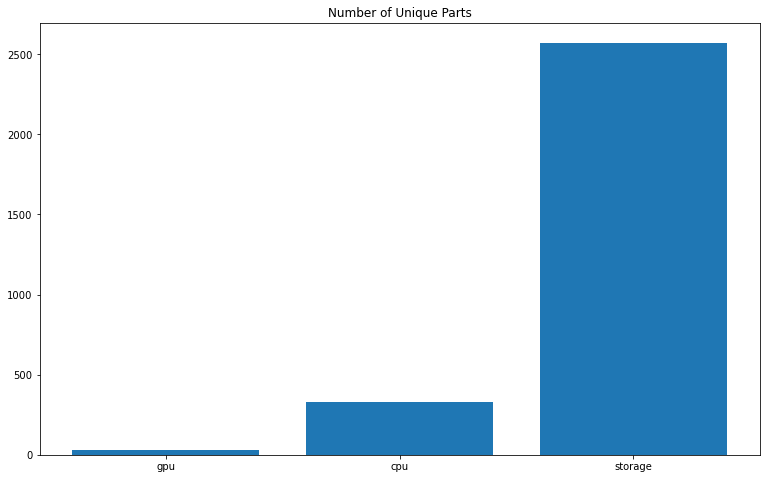

In [15]:
fig = plt.figure(figsize=(10,6))
ax = fig.add_axes([0,0,1,1])
comps = ['gpu', 'cpu', 'storage']
counts = [len(gpus), len(cpus), len(stor)]
ax.bar(comps, counts)
plt.title('Number of Unique Parts')
plt.show()

The count of the unique components in the sampled dataset will possibly present issues that will lead to a sparse matrix. Even though SparsePCA is available for use, I want to push through with trying FAMD too to see its explained variance. I will simply be getting the manufacturer from the CPUs to simply divide them between Intel and AMD via *cpu_make* alone. The same will do for the GPUs with a string match function.

In [16]:
# selecting storage size only
df_sampled.drop('cpu_sku', axis=1, inplace=True)
stor = df_sampled.storage.str.extract(r'(\d+\,{0,1}\d*) ?GB')
df_sampled.storage = stor[0]
df_sampled.storage = df_sampled.storage.str.replace(',','')

Now, let's take another look at the GPUs:

In [17]:
plt.figure(figsize=(25,15))
fig = px.histogram(
    df_sampled, 
    x="gpu",
    width=640,
    height=480
    )
fig.show()

<Figure size 1800x1080 with 0 Axes>

Using a regex to pick the first word, which can be either 'NVIDIA' or 'AMD'.

In [18]:
gpu = df_sampled.gpu.str.extract(r'([A-Z]\w+) ')
df_sampled.gpu = gpu[0]

In [19]:
plt.figure(figsize=(25,15))
fig = px.histogram(
    df_sampled, 
    x="gpu",
    width=640,
    height=480
    )
fig.show()

<Figure size 1800x1080 with 0 Axes>

There is some class imbalance, which may affect clustering later on.

In [20]:
df_sampled.isnull().mean()

cpu_clock_freq           0.000000
cpu_cores                0.000000
cpu_litho                0.000000
cpu_make                 0.000000
cpu_score                0.000000
cpu_tdp                  0.000000
cpu_fps                  0.000000
gpu                      0.000000
gpu_avg_clock_freq       0.000000
gpu_avg_memclock_freq    0.000000
gpu_clock_freq           0.000000
gpu_count                0.000000
gpu_memclock_freq        0.000000
gpu_score                0.000000
gpu_vram                 0.000000
gt1                      0.000000
gt2                      0.000000
ram                      0.000000
ram_clock_freq           0.000000
score                    0.000000
storage                  0.000241
dtype: float64

Some nulls came out in the open after only taking the storage size. Since it is negligible-

In [21]:
df_sampled.dropna(inplace=True)
df_sampled.storage = pd.to_numeric(df_sampled.storage)
df_sampled = df_sampled.loc[df_sampled.cpu_clock_freq < 6000]
df_sampled.isnull().mean()

cpu_clock_freq           0.0
cpu_cores                0.0
cpu_litho                0.0
cpu_make                 0.0
cpu_score                0.0
cpu_tdp                  0.0
cpu_fps                  0.0
gpu                      0.0
gpu_avg_clock_freq       0.0
gpu_avg_memclock_freq    0.0
gpu_clock_freq           0.0
gpu_count                0.0
gpu_memclock_freq        0.0
gpu_score                0.0
gpu_vram                 0.0
gt1                      0.0
gt2                      0.0
ram                      0.0
ram_clock_freq           0.0
score                    0.0
storage                  0.0
dtype: float64

-dropping that/those row/rows are no problem whatsoever with no palpable effect to the dataset.

Now, I want to see how the scores are distributed.

In [22]:
plt.figure(figsize=(25,15))
fig = px.histogram(
    df_sampled, 
    x="score",
    width=800,
    height=600
    )
fig.show()

<Figure size 1800x1080 with 0 Axes>

Albeit not normally distributed, this was interesting to see. Beyond ~11,000 score, the data falls off due to less systems having really powerful components.

Most results are visibly near to the median, meaning most people who ran Time Spy had a middling or lower system. Now, I do not know if this would be a good enough metric to break the results down into three (3) tiers, namely, "High", "Middle", and "Low". To put it simply, I will be using the 23rd and the 95th percentile as cutoffs for the tiers based on the histogram above.

How well this goes entirely depends on what the visualizations would tell.

In [23]:
max_score = df_sampled.score.max()

# adding ranking on results
bin = [0, math.floor(np.percentile(df_sampled.score.to_list(), 23)), math.floor(np.percentile(df_sampled.score.to_list(), 95)), max_score]
category = pd.cut(df_sampled.score, bin, labels=['Low','Middle','High']) 
category = category.to_frame()
category.columns = ['RankingTier']
df_new = pd.concat([df_sampled, category], axis=1)

And just to see the class distribution:

In [24]:
plt.figure(figsize=(25,15))
fig = px.histogram(
    df_new, 
    x="RankingTier",
    width=640,
    height=480
    )
fig.show()

<Figure size 1800x1080 with 0 Axes>

In [25]:
df_new.describe()

,cpu_clock_freq,cpu_cores,cpu_litho,cpu_score,cpu_tdp,cpu_fps,gpu_avg_clock_freq,gpu_avg_memclock_freq,gpu_clock_freq,gpu_count,gpu_memclock_freq,gpu_score,gpu_vram,gt1,gt2,ram,ram_clock_freq,score,storage
count,29052.000000,29052.000000,29052.000000,29052.000000,29052.000000,29052.000000,29052.000000,29052.000000,29052.000000,29052.000000,29052.000000,29052.000000,29052.000000,29052.000000,29052.000000,29052.000000,29052.000000,29052.000000,29052.000000
mean,4316.530807,7.106430,10.599133,7740.774680,79.252237,25.756678,1812.602506,1752.921348,1942.213583,1.003132,1787.551976,8893.903174,7810.028914,58.071199,50.162822,23056.871541,2994.991154,8582.183533,618.945821
std,352.551213,2.216431,4.463220,2425.533786,23.866288,8.491542,342.443153,259.136997,166.722246,0.055880,240.039556,1992.929173,1096.941533,14.265192,12.352299,12173.767235,1487.214362,1890.820808,422.378144
min,801.000000,2.000000,0.000000,691.000000,15.000000,0.000000,3.000000,6.000000,735.000000,1.000000,875.000000,232.000000,64.000000,0.000000,0.000000,4096.000000,0.000000,269.000000,34.000000
25%,4142.000000,6.000000,7.000000,6152.750000,65.000000,20.470000,1820.000000,1725.000000,1920.000000,1.000000,1750.000000,8621.000000,8192.000000,56.330000,48.420000,16384.000000,2660.000000,8110.750000,256.000000
50%,4316.000000,6.000000,7.000000,7328.500000,65.000000,24.560000,1895.000000,1750.000000,1967.000000,1.000000,1750.000000,9506.000000,8192.000000,63.550000,52.725000,16384.000000,3192.000000,9118.000000,500.000000
75%,4499.000000,8.000000,14.000000,9567.250000,95.000000,32.080000,1961.000000,1800.000000,2029.000000,1.000000,1820.000000,10058.000000,8192.000000,65.980000,58.160000,32768.000000,3206.000000,9762.000000,1000.000000
max,5935.000000,32.000000,65.000000,16426.000000,280.000000,55.190000,2243.000000,7701.000000,2577.000000,2.000000,7701.000000,21569.000000,24576.000000,137.450000,126.190000,262144.000000,60512.000000,19611.000000,10000.000000


>*Caesar's Note: There were zero values that will affect dimensionality reduction later, specifically on dimensionality reduction, hence the removal of rows that have zero values.*

In [26]:
df_new = df_new.loc[~(
    (df_new['cpu_fps'] == 0) | 
    (df_new['gt1'] == 0) | 
    (df_new['gt2'] == 0) | 
    (df_new['ram'] == 0) |
    (df_new['cpu_litho'] == 0) |
    (df_new['ram_clock_freq'] == 0))]

# there were weird RAM clock frequencies that go above 5000MHz which is theoretically impossible at the time of making this project
df_new = df_new.loc[df_new.ram_clock_freq < 5000.0]

In [27]:
df_new.describe()

,cpu_clock_freq,cpu_cores,cpu_litho,cpu_score,cpu_tdp,cpu_fps,gpu_avg_clock_freq,gpu_avg_memclock_freq,gpu_clock_freq,gpu_count,gpu_memclock_freq,gpu_score,gpu_vram,gt1,gt2,ram,ram_clock_freq,score,storage
count,28719.000000,28719.000000,28719.000000,28719.000000,28719.000000,28719.000000,28719.000000,28719.000000,28719.000000,28719.000000,28719.000000,28719.000000,28719.000000,28719.000000,28719.000000,28719.000000,28719.000000,28719.000000,28719.000000
mean,4316.729900,7.107281,10.605348,7743.180299,79.271632,26.016032,1813.745082,1753.306034,1942.731467,1.003134,1787.827188,8898.001567,7812.053623,58.619725,50.634718,23056.909711,2964.466973,8585.872210,617.981824
std,352.580921,2.215719,4.464635,2424.671121,23.800666,8.146028,340.562678,259.636686,165.740620,0.055894,240.709351,1986.998732,1093.436170,13.198923,11.434681,12177.594220,568.061833,1885.329948,421.259102
min,801.000000,2.000000,7.000000,691.000000,15.000000,2.320000,3.000000,6.000000,735.000000,1.000000,875.000000,232.000000,64.000000,0.740000,2.000000,4096.000000,1.000000,269.000000,34.000000
25%,4142.000000,6.000000,7.000000,6155.000000,65.000000,20.680000,1821.000000,1725.000000,1920.000000,1.000000,1750.000000,8626.500000,8192.000000,56.560000,48.655000,16384.000000,2660.000000,8116.000000,256.000000
50%,4316.000000,6.000000,7.000000,7330.000000,65.000000,24.630000,1895.000000,1750.000000,1967.000000,1.000000,1750.000000,9507.000000,8192.000000,63.600000,52.810000,16384.000000,3192.000000,9118.000000,500.000000
75%,4499.000000,8.000000,14.000000,9569.000000,95.000000,32.150000,1961.000000,1800.000000,2029.000000,1.000000,1820.000000,10058.000000,8192.000000,66.010000,58.210000,32768.000000,3206.000000,9762.000000,1000.000000
max,5935.000000,32.000000,65.000000,16426.000000,280.000000,55.190000,2243.000000,7701.000000,2577.000000,2.000000,7701.000000,21569.000000,24576.000000,137.450000,126.190000,262144.000000,4600.000000,19611.000000,10000.000000


### a. Pairwise Relationships

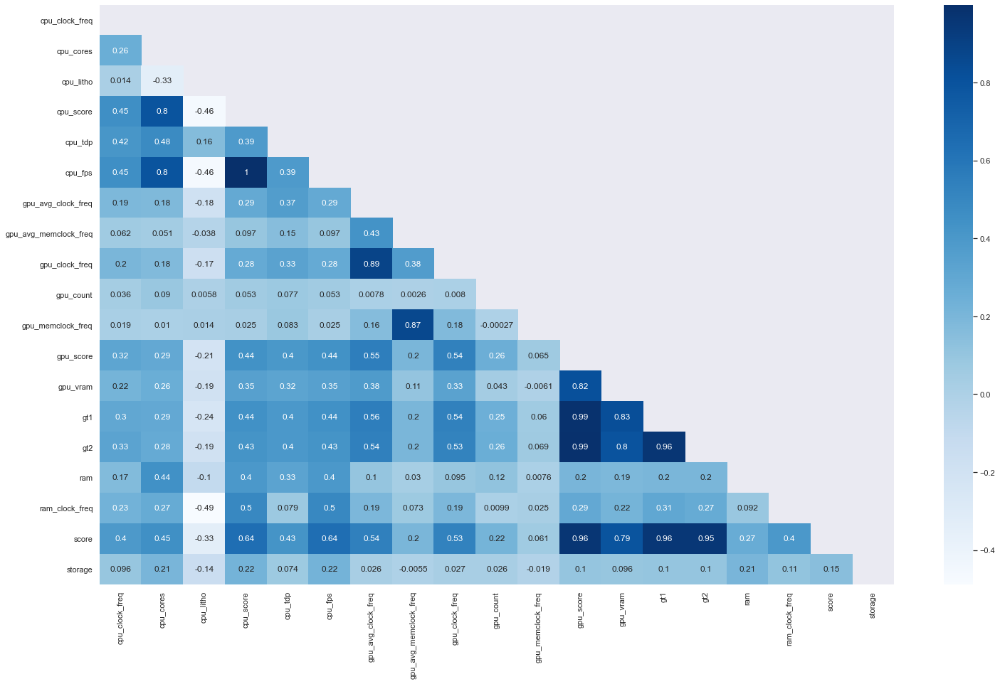

In [28]:
mask = np.triu(np.ones_like(df_new.corr()))
sns.set(rc={'figure.figsize':(25,15)})
sns.heatmap(
    df_new.corr(),
    cmap='Blues',
    mask=mask,
    annot=True
)
plt.show()

While this is an unsupervised learning project, it is notable that *gt1* and *gt2* are almost perfectly correlated with both having equally high correlation values to *score*. The same goes for *gpu_score*. I will be dropping the three scoring metrics to avoid having too similar observations.

In [29]:
df_new.drop(
    ["gpu_score",
    "gt1", "gt2"],
    axis=1,
    inplace=True
)

## iv. Visualization via t-SNE and UMAP

For visualization, I will be using both t-SNE, and SOM via MiniSOM to have the best of both worlds and compare notable differences, if there will be any.
As mentioned in the preface, the labels (GPUs) are known and will be separated from this point on.

Before anything, categorical variables need to be One Hot Encoded.

### Encoding and Scaling

In [30]:
X = df_new.drop('RankingTier', axis=1)
y = df_new.RankingTier

In [31]:
cat = X.select_dtypes(include=['O'])
num = X.select_dtypes(include=['int64', 'float64'])
X = pd.concat([pd.get_dummies(cat), num], axis=1)

#train-test split at 20%
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [32]:
scaler = StandardScaler()
X_std = scaler.fit_transform(X_train)

### a. t-SNE

In [33]:
tsne = manifold.TSNE(
    n_components=2,
    early_exaggeration=10.0,
    learning_rate=150.0, 
    perplexity=100,
    n_iter=250,
    n_jobs=-1
)
X_tsne = tsne.fit_transform(X_std)

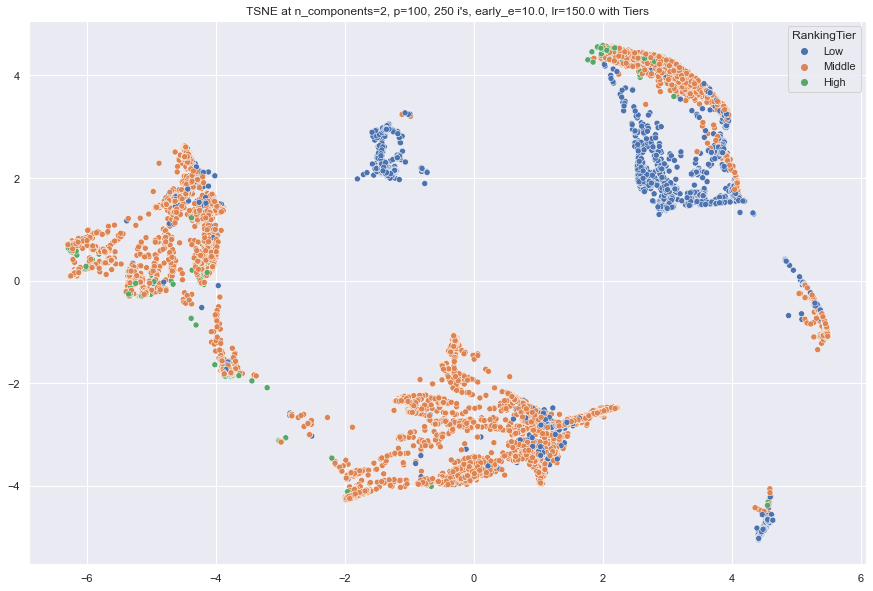

In [34]:
sns.set(rc={'figure.figsize':(15,10)})
sns.scatterplot(
    x=X_tsne[:,0],
    y=X_tsne[:,1],
    hue=y_train
)
plt.title(f"TSNE at n_components=2, p=100, 250 i's, early_e=10.0, lr=150.0 with Tiers")
plt.show()

To my surprise, albeit slow, t-SNE did a somewhat good job at mapping out possible clusters but without bigger groupings and bad labels.

Next up is UMAP.

In [35]:
umap_model = umap.UMAP(n_neighbors=20, min_dist=0.35)
X_umap = umap_model.fit_transform(X_std)

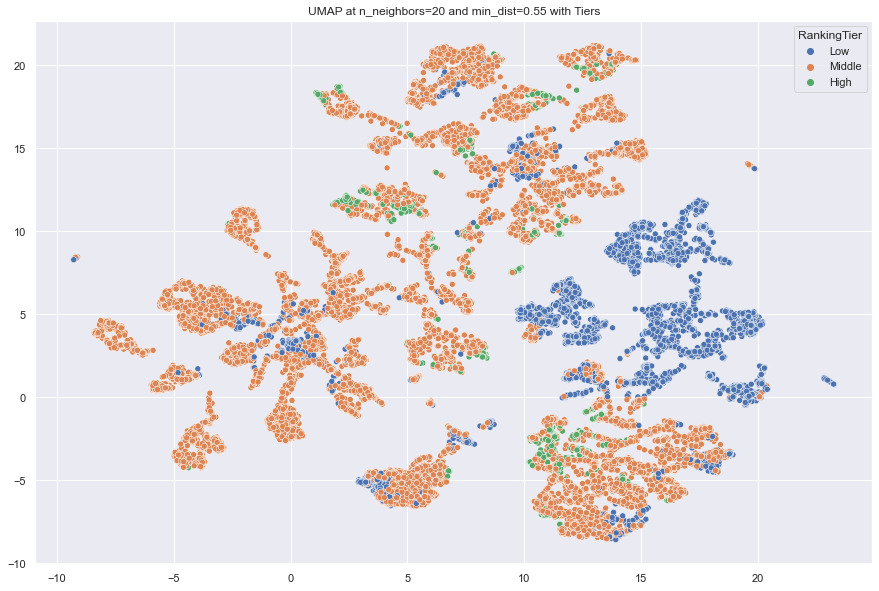

In [36]:
sns.set(rc={'figure.figsize':(15,10)})
sns.scatterplot(
    x=X_umap[:,0],
    y=X_umap[:,1],
    hue=y_train
)
plt.title(f"UMAP at n_neighbors=20 and min_dist=0.55 with Tiers")
plt.show()

There is less density on UMAP with less outliers. The way that the Low Tier computers are segregated from most of the clusters defines it well but the Middle and High Tier computers are too close to each other. Mostly, the High Tier computers skirt around the borders of Middle Tier ones, as seen in around (10,15) and (0,-5). This might mean that most High Tier computers are not much different from Middle Tier by their binning through Time Spy score. Considering this scatter plot, it would be hard to pick out three large clusters.

Between the two, t-SNE is the better visualizer. Now, I will use PCA to see how different it differs on different algorithms since I have one hot encoded categorical features.

Due to time constraints, the goal for now is simply being able to have 3 clusters using t-SNE.

## v. Reduction via PCA

In [37]:
pca = PCA(n_components=10)
X_pca = pca.fit_transform(X_std)

In [38]:
X_pca.shape

(22975, 10)

In [39]:
exp_var_cumul = np.cumsum(pca.explained_variance_ratio_)

px.area(
    x=range(1, exp_var_cumul.shape[0] + 1),
    y=exp_var_cumul,
    labels={"x": "# Components", "y": "Explained Variance"}
)

PCA at 10 components breaks the 90% explained variance barrier so moving forward, I will also try PCA with 10 components to satisfy the requirements of the clustering methods I will be using.

In [40]:
pca = PCA(n_components=10)
X_pca = pca.fit_transform(X_std)

# II. Clustering

## i. DBSCAN

#### With PCA=10

In [41]:
scan = DBSCAN(
    metric="euclidean",
    eps=2,
    min_samples=200,
    algorithm="ball_tree",
    n_jobs=-1
)
scan.fit(X_pca)
labels = scan.labels_
X_train['db_cluster'] = scan.fit_predict(X_pca)
X_train['db_cluster'].value_counts()

 1    11670
 0     7686
-1     2925
 2      694
Name: db_cluster, dtype: int64

In [42]:
dpc_sil = silhouette_score(X_pca, labels)
print("Silhouette Coefficient for DBSCAN with t-SNE: %0.3f" % dpc_sil)
dpc_ars = adjusted_rand_score(y_train, X_train['db_cluster'])
print("Adjusted Rand index for DBSCAN with t-SNE: %0.3f" % dpc_ars)

Silhouette Coefficient for DBSCAN with t-SNE: 0.175
Adjusted Rand index for DBSCAN with t-SNE: 0.122


DBSCAN with PCA=10 came out with 3 (three) clusters but with a considerable amount of outliers.

#### With t-SNE

In [43]:
scan = DBSCAN(
    metric="euclidean",
    eps=1.85,
    min_samples=1000,
    algorithm="ball_tree",
    n_jobs=-1
)
scan.fit(X_tsne)
labels = scan.labels_
X_train['db_cluster'] = scan.fit_predict(X_tsne)
X_train['db_cluster'].value_counts()

 0    13346
 2     7307
 1     1330
-1      992
Name: db_cluster, dtype: int64

With these parameters, DBSCAN with t-SNE can correctly separate the 3 (three) clusters seen on t-SNE but not representative of the real labels.

In [44]:
dbs_sil = silhouette_score(X_tsne, labels)
print("Silhouette Coefficient for DBSCAN with t-SNE: %0.3f" % dbs_sil)
dbs_ars = adjusted_rand_score(y_train, X_train['db_cluster'])
print("Adjusted Rand index for DBSCAN with t-SNE: %0.3f" % dbs_ars)

Silhouette Coefficient for DBSCAN with t-SNE: 0.259
Adjusted Rand index for DBSCAN with t-SNE: 0.286


The Silhouette score and Adjusted Rand index are both bad for DBSCAN, which does not bode well.

## ii. Hierarchical Clustering

Before anything, just so there would be a visual definition of the hierarchy, I will be adding in a function for plotting the dendrogram.

In [45]:
def plot_dendrogram(model, **kwargs):
    """
    A basic function for plotting a dendrogram. Sourced from the following link:
    https://github.com/scikit-learn/scikit-learn/blob/70cf4a676caa2d2dad2e3f6e4478d64bcb0506f7/examples/cluster/plot_hierarchical_clustering_dendrogram.py
    
    Parameters:
        model (object of class sklearn.cluster.hierarchical.AgglomerativeClustering): a fitted scikit-learn hierarchical clustering model.
    
    Output: a dendrogram based on the model based in the parameters.
    
    Returns: N/A    
    """
    # Children of hierarchical clustering
    children = model.children_

    # Distances between each pair of children
    # Since we don't have this information, we can use a uniform one for plotting
    distance = np.arange(children.shape[0])

    # The number of observations contained in each cluster level
    no_of_observations = np.arange(2, children.shape[0]+2)

    # Create linkage matrix and then plot the dendrogram
    linkage_matrix = np.column_stack([children, distance, no_of_observations]).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

#### With PCA=10

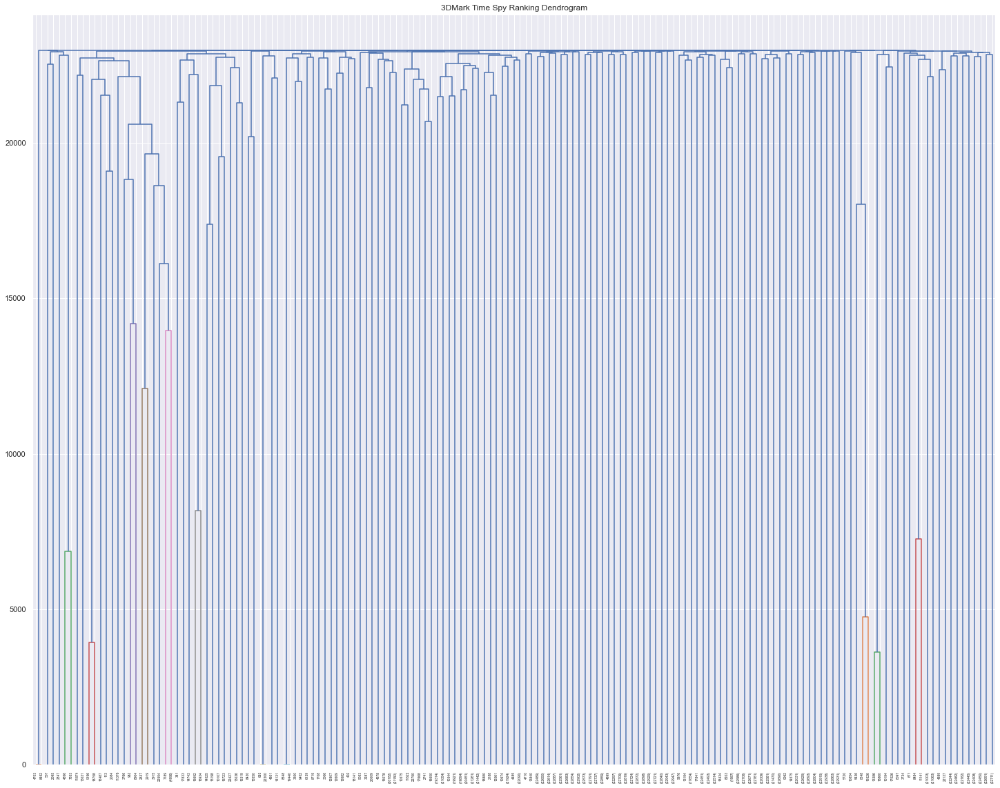

In [46]:
dist = gower.gower_matrix(X_pca)
#clustering
hier = AgglomerativeClustering(
    n_clusters=3, 
    affinity="precomputed", 
    linkage="complete"
)
model = hier.fit(dist)
X_train["hier"] = hier.fit_predict(dist)
labels = model.labels_
# plotting
plt.figure(figsize=(25, 20))
plt.title("3DMark Time Spy Ranking Dendrogram")
plot_dendrogram(hier, truncate_mode="level", p=10)
plt.show()

Agglomerative Clustering with PCA does an acceptable job clustering the sampled dataset possibly due to the tiers being too similar as seen in UMAP.

In [47]:
hpc_sil = silhouette_score(X_pca, labels)
print("Silhouette Coefficient for AggClustering with PCA=10: %0.3f" % hpc_sil)
hpc_ars = adjusted_rand_score(y_train, X_train['hier'])
print("Adjusted Rand index for AggClustering with PCA=10: %0.3f" % hpc_ars)

Silhouette Coefficient for AggClustering with PCA=10: 0.786
Adjusted Rand index for AggClustering with PCA=10: 0.003


The silhouette score is higher but this does not mean the labels are good as shown by the Adjusted Rand index.

#### With t-SNE

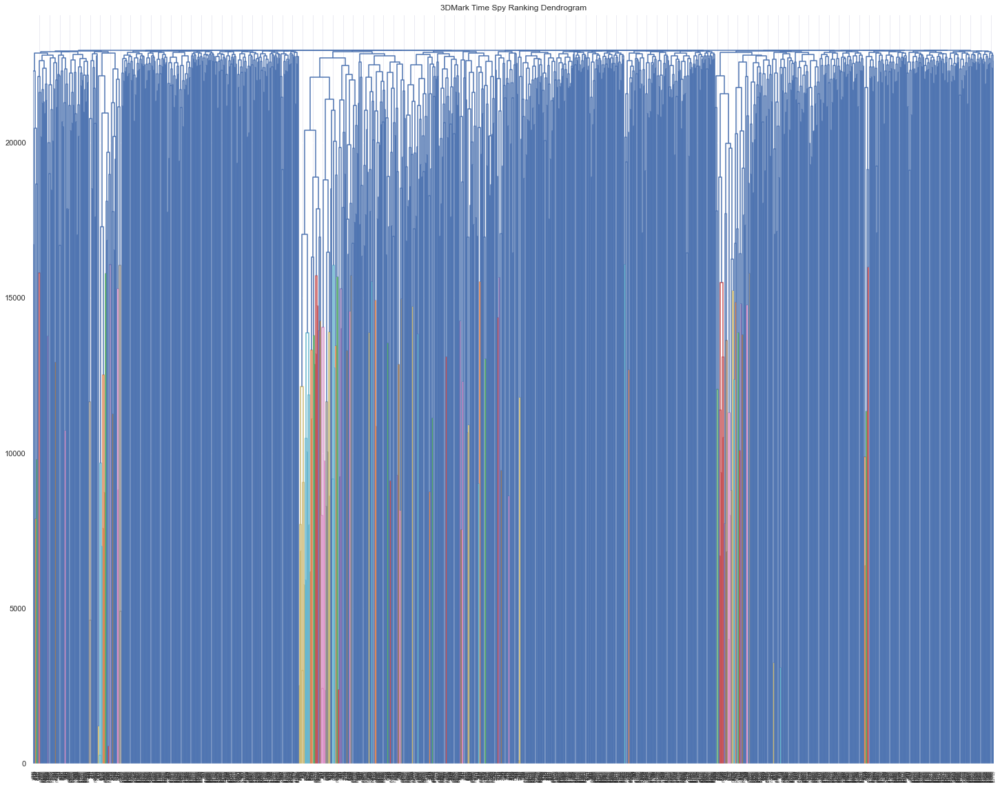

In [48]:
dist = gower.gower_matrix(X_tsne)
#clustering
hier = AgglomerativeClustering(
    n_clusters=3, 
    affinity="precomputed", 
    linkage="complete"
)
model = hier.fit(dist)
X_train["hier"] = hier.fit_predict(dist)
labels = model.labels_
# plotting
plt.figure(figsize=(25, 20))
plt.title("3DMark Time Spy Ranking Dendrogram")
plot_dendrogram(hier, truncate_mode="level", p=10)
plt.show()

With t-SNE, there were 2 (two) notable clusters. This might be better than DBSCAN but that still is to be seen later in scoring.

In [49]:
hts_sil = silhouette_score(X_tsne, labels)
print("Silhouette Coefficient for AggClustering with PCA=10: %0.3f" % hts_sil)
hts_ars = adjusted_rand_score(y_train, X_train['hier'])
print("Adjusted Rand index for AggClustering with PCA=10: %0.3f" % hts_ars)

Silhouette Coefficient for AggClustering with PCA=10: 0.571
Adjusted Rand index for AggClustering with PCA=10: 0.077


Albeit having better Adjusted Rand index, the results are still not desirable.

## iii. GMM

#### With PCA=10

In [50]:
gmm_cluster3 = GaussianMixture(
    n_components=3,
    covariance_type='full',
    max_iter=50,
    n_init=3
    )
X_train["gmm"] = gmm_cluster3.fit_predict(X_std)

centers = pd.DataFrame(
    gmm_cluster3.means_, 
    columns=X_train.drop(['db_cluster', 'hier', 'gmm'], 
    axis=1
    ).columns)

inverse = pd.DataFrame(
    scaler.inverse_transform(centers), 
    columns=X_train.drop(['db_cluster', 'hier', 'gmm'], 
    axis=1
    ).columns)

inverse.style.background_gradient()

,cpu_make_AMD,cpu_make_Intel,gpu_AMD,gpu_NVIDIA,cpu_clock_freq,cpu_cores,cpu_litho,cpu_score,cpu_tdp,cpu_fps,gpu_avg_clock_freq,gpu_avg_memclock_freq,gpu_clock_freq,gpu_count,gpu_memclock_freq,gpu_vram,ram,ram_clock_freq,score,storage
0,0.515304,0.484696,0.378517,0.621483,4201.368481,9.843205,17.890250,7365.816453,119.693707,24.748102,1853.176362,2291.212541,1960.646582,1.156939,2324.480065,8180.257662,42603.499750,2501.752235,8918.055416,939.595169
1,1.000000,0.000000,0.522201,0.477799,4262.676353,7.629142,7.864003,8497.825382,78.781150,28.551390,1907.390931,1776.801126,1981.928130,1.000000,1788.544316,8192.000000,23721.201332,3133.392859,9357.318492,649.399495
2,0.152593,0.847407,0.155617,0.844383,4393.539698,6.274746,13.983401,6740.885042,78.157448,22.648673,1688.632711,1698.752561,1889.673593,1.000000,1762.825592,7286.447870,21402.878683,2757.988462,7539.770666,564.490067


In [51]:
gmm_sil = silhouette_score(X_std, X_train['gmm'].values)
print("Silhouette Coefficient for AggClustering with PCA=10: %0.3f" % gmm_sil)
gmm_ars = adjusted_rand_score(y_train, X_train['gmm'])
print("Adjusted Rand index for AggClustering with PCA=10: %0.3f" % gmm_ars)

Silhouette Coefficient for AggClustering with PCA=10: 0.222
Adjusted Rand index for AggClustering with PCA=10: 0.246


GMM, in my opinion, did well on separating the clusters -
* Class 1 defines the Low Tier - mostly laptops and standard computers not built for gaming due to the cpu_score, cpu_tdp, score, and ram_clock_freq at the low-end.
* Class 0 defines the Middle Tier - multipurpose systems built within the last three years due to an overwhelming amount of computers with AMD processors and GPUs which are reflected by cpu_scores. Also notable are the cpu_score, cpu_tdp, gpu_vram, and score.
* Class 2 defines the High Tier - high-performance systems built with gaming in mind (due to all having NVIDIA GPUs) but still has a lot of supposedly those in Class 1 due to similar means except for score.

And so far, GMM presented the best scores albeit a lower silhouette coefficient than the previous ones.

## iv. K-Medoids

In [52]:
dist = pdist(X_std, 'hamming')
dist_ = pd.DataFrame(
    squareform(dist), 
    index=X_train.index,
    columns=X_train.index)

In [53]:
orig_index = X_train.index

In [54]:
dist_.reset_index(drop=True, inplace=True)
dist_.columns = dist_.index

In [55]:
init_medoids = dist_.sample(3).index
print(init_medoids)

kmd = kmedoids(
    dist_,
    init_medoids,
    data_type="distance_matrix"
)
kmd.process()
clusters = kmd.get_clusters()
medoids = kmd.get_medoids()

Int64Index([12862, 15835, 20496], dtype='int64')


In [56]:
test_vals = list(orig_index)

In [57]:
res = {} 
for key in list(dist_.columns): 
    for value in test_vals: 
        res[key] = value
        test_vals.remove(value)
        break

In [58]:
def Cloning(li1): 
    li_copy = li1[:] 
    return li_copy 

backup_clusters = Cloning(clusters)
backup_medoids = Cloning(medoids)

In [59]:
count=0

for cur in clusters:
    val_count=0
    for val in cur:
        clusters[count][val_count] = res[val]
        val_count+=1
    count+=1

In [60]:
count=0

for cur in medoids:
    medoids[count] = res[cur]
    count+=1

In [61]:
X_train["kmd"] = 0

for i in range(len(clusters)):
    X_train.loc[clusters[i], "kmd"] = i

In [62]:
medoids

[454911, 349920, 1218757]

In [63]:
kmd_sil = silhouette_score(X_std, X_train['kmd'].values)
print("Silhouette Coefficient for K-Medoids: %0.3f" % kmd_sil)
kmd_ars = adjusted_rand_score(y_train, X_train['kmd'])
print("Adjusted Rand index for K-Medoids: %0.3f" % kmd_ars)

Silhouette Coefficient for K-Medoids: 0.137
Adjusted Rand index for K-Medoids: 0.037


The medoids selected were dissimilar enough from one another, as denoted by the *score* column.

## v. Evaluation

To evaluate which is the best, the method with the highest Silhouette and Adjusted Rand Score is preferred.

## vi. Best Method

In [64]:
results =  pd.DataFrame(
    [[dpc_sil, dpc_ars],
    [dbs_sil, dbs_ars],
    [hpc_sil, hpc_ars],
    [hts_sil, hts_ars],
    [gmm_sil, gmm_ars],
    [kmd_sil, kmd_ars]],
    columns=["Silhouette Score", "Adjusted Rand Score"]
)
results.index = [
    "DBSCAN with PCA",
    "DBSCAN with t-SNE",
    "Agglomerative Clustering with PCA",
    "Agglomerative Clustering with t-SNE",
    "GMM with Scaled Data",
    "K-Medoids with Scaled Data"]

Agglomerative Clustering with PCA gave the highest Silhouette score but with the lowest Adjusted Rand score.
GMM with Scaled Data gave the highest Adjusted Rand Score but with a low Silhouette score.

Between the two, I would personally go with GMM due to the accuracy factor provided by the Adjusted Rand score.
25.5% is still low as an acceptable score but this has been a good start for this project.

# III. Summary

The best method sans runtime was Gaussian Mixture Model using scaled data. For the life of me I could not get PCA data run in it since it has 10 components. Running it with just 2 gave significantly lower scores than what you are seeing in the table above.

GMM was able to have 25.5% accuracy based on labeling by *RankingTier*, which, I think was exceptional considering the unidentifiabel characteristics of the clusters.

The dataset was not clean enough to run tests from importing. There were miscellaneous and astronomical values in some numerical variables that significantly took more time than necessary to correct or eliminate. This presented a chain of issues I do not simply have the time to deal with before the presentation.

At PCA = 10, the explained variance was above 90% - which was desirable.

### Visualizations used:
* t-SNE
* UMAP

### Clustering Methods used:
* DBSCAN
* Agglomerative Clustering
* Gaussian Mixture Model
* K-Medoids

The Gaussian Mixture Model gave the best results out of the clustering algorithms with an Adjusted Rand score of *0.255243*.

Note from researcher:

I will be digging more into the data over the holidays to find out the actual distinction between the clusters.

Once it's discovered, I will be updating this to have a more accurate labelling.

Thank you for taking the time to go through this project's notebook!